<a href="https://colab.research.google.com/github/biplobgauli/996/blob/main/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Importing Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud
import plotly.express as px
pd.set_option("display.max_columns", None) ## show all columns

In [ ]:
from google.colab import drive
drive.mount('/drive')
df = pd.read_csv('/drive/MyDrive/Colab Notebooks/US_Accidents/Final_Data.csv')
df.head()

Mounted at /drive


,Severity,Distance(mi),State,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Civil_Twilight,Date,Time,Year,Month,Hours,Week,State_Name
0,3,3.230,OH,42.1,36.1,58.0,29.76,10.0,10.4,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,Night,2016-02-08,00:37:08,2016,2,0.616667,Monday,Ohio
1,3,0.500,OH,37.0,29.8,93.0,29.69,10.0,10.4,0.01,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,Day,2016-02-08,07:53:43,2016,2,7.883333,Monday,Ohio
2,2,1.427,OH,35.6,29.2,100.0,29.66,10.0,8.1,0.00,Overcast,False,False,False,False,False,False,False,False,False,False,False,True,Day,2016-02-08,08:16:57,2016,2,8.266667,Monday,Ohio
3,2,0.521,OH,33.1,30.0,92.0,29.63,0.5,3.5,0.08,Snow,False,False,False,False,True,False,False,False,False,False,False,False,Day,2016-02-08,11:51:46,2016,2,11.850000,Monday,Ohio
4,2,0.491,OH,39.0,31.8,70.0,29.59,10.0,11.5,0.00,Overcast,False,False,False,False,False,False,False,False,False,False,False,False,Day,2016-02-08,14:19:57,2016,2,14.316667,Monday,Ohio


In [ ]:
#Word Cloud function
def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")

text = df[df['Weather_Condition'].notnull()] 
text=df['Weather_Condition'].str.cat(sep=' ') ##combining all weather conditions

In [ ]:
#removing adjectives from weather condition that don't carry a value
text=text.replace("Mostly","")
text=text.replace("Light","")
text=text.replace("Partly","")
text=text.replace("Heavy","")
text=text.replace("Patches","")
text=text.replace("Scattered","")
text=text.replace("Vicinity","")
text=text.replace("Shallow","")

text

' Rain  Rain Overcast Snow Overcast Snow  Snow Overcast  Snow  Snow  Snow Overcast  Snow  Snow  Snow  Snow  Snow Cloudy  Snow  Snow  Snow  Snow  Snow  Snow  Snow Overcast  Snow Overcast  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Snow  Cloudy  Cloudy  Cloudy  Snow  Snow  Snow  Snow  Snow Overcast  Snow  Snow  Snow  Snow  Snow  Snow Overcast Overcast Overcast  Snow  Snow  Snow Overcast Overcast  Snow Overcast Overcast  Clouds Overcast  Cloudy Overcast Overcast Overcast  Cloudy  Cloudy  Snow  Cloudy Cloudy Overcast Overcast Clear  Cloudy Clear  Clouds Clear Overcast  Clouds Overcast  Snow  Cloudy Clear  Snow  Snow  Cloudy Overcast Overcast  Cloudy  Cloudy  Snow  Cloudy  Snow Clear  Clouds  Snow  Snow  Cloudy  Cloudy Clear Clear Clear  Cloudy  Clouds  Clouds  Snow Clear Overcast  Cloudy  Snow  Clouds  Cloudy  Cloudy  Clouds  Cloudy  Snow Overcast Overcast Overcast  Cloudy  Clouds Clear Overcast  Clouds Clear Clear  Clouds Sn

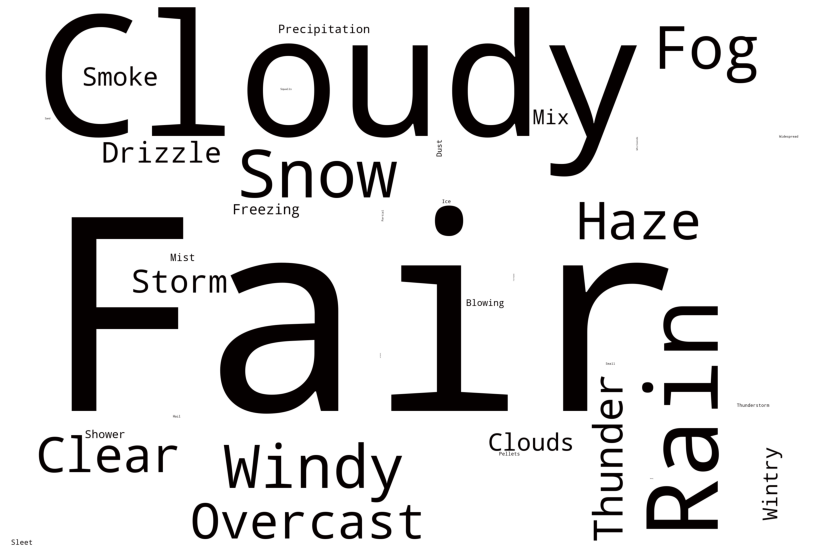

In [ ]:
#word cloud chart
wordcloud=WordCloud(collocations=False,background_color="white", width=3000, height=2000, max_words=500).generate(str(text)) #generate the cloud

wordcloud.recolor(color_func = black_color_func)
plt.figure(figsize=[15,10])
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.imshow(wordcloud) #print

In [ ]:
#create a new df that has the count of incidents by state
df.insert(loc=0, column='id', value=np.arange(len(df)))
df_state_count=df.groupby("State")["id"].count()
df_state_count=df_state_count.to_frame()
df_state_count.rename(columns = {'id':'Count'}, inplace = True) #rename column
States =df_state_count.index
df_state_count.insert(0, 'State', States)
df_state_count.reset_index(drop=True, inplace=True)

In [ ]:
##plot the map of count by states
fig_map = px.choropleth(df_state_count, locations="State",
                    locationmode="USA-states",
                    scope="usa",
                    color_continuous_scale="tealrose",
                    range_color=(0, 200000),
                    color="Count")
fig_map.update_layout(title = 'Traffic Incidents in USA by States ', title_x=0.5,geo_scope='usa')
fig_map.show()

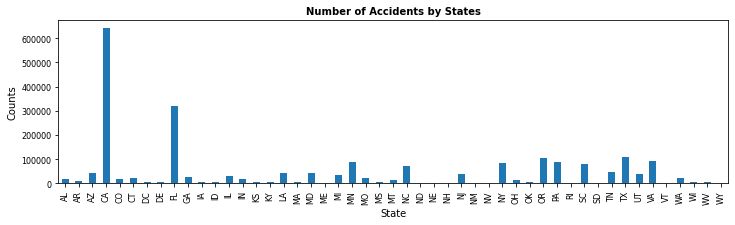

In [ ]:
df['StateCount']=1
ax = df.groupby('State').size().plot(kind='bar', stacked=True, figsize=[12, 3]) 
plt.rcParams["figure.figsize"] = (14,5)
plt.rcParams["figure.dpi"] = (200)
ax.set_ylabel('Counts')
ax.set_title('Number of Accidents by States', fontsize=10, fontweight='bold')
plt.tick_params(labelsize=8)


In [ ]:
#Top 10 States of US with most cases of accidents
counts = df.groupby(['State','Severity']).size().unstack()      # Getting the counts of accidents in a State with every level of severity
counts['Sum'] = counts.sum(axis=1)  # Getting Total number of accidents
counts = counts.sort_values(by='Sum',ascending=False).drop(columns=['Sum']).fillna(0) # Sorting Data frame
counts

Severity,1,2,3,4
State,,,,
CA,4628.0,626496.0,6232.0,4481.0
FL,2685.0,308965.0,4100.0,4768.0
TX,940.0,99657.0,7446.0,2310.0
OR,1253.0,97400.0,1684.0,2811.0
VA,1372.0,83083.0,2341.0,5262.0
PA,130.0,78722.0,2267.0,6069.0
MN,29.0,83645.0,2545.0,453.0
NY,569.0,74857.0,4739.0,5239.0
SC,49.0,79098.0,426.0,1181.0


Text(0.5, 1.0, 'Top 10 States with most cases')

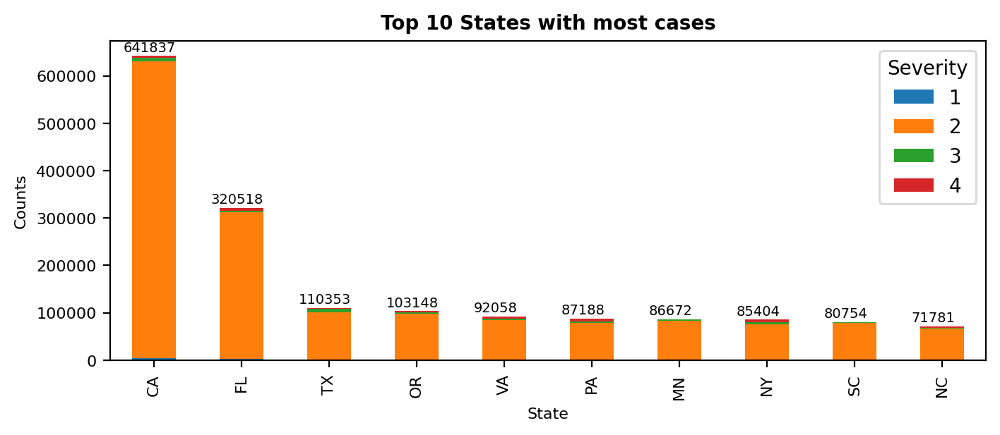

In [ ]:
ax = counts[:10].plot(kind='bar', stacked=True, figsize=[8, 3])
total = counts[:10].sum(axis=1)
for index, data in enumerate(total):
    ax.text(index-0.35,data+10000,int(data), fontsize = 7)
ax.set_ylabel('Counts',fontsize=8)
ax.set_xlabel('State',fontsize=8)
plt.tick_params(labelsize=8)
ax.set_title('Top 10 States with most cases', fontsize=10, fontweight='bold')


Text(0.5, 1.0, 'Mean Distance of Severity of Accident')

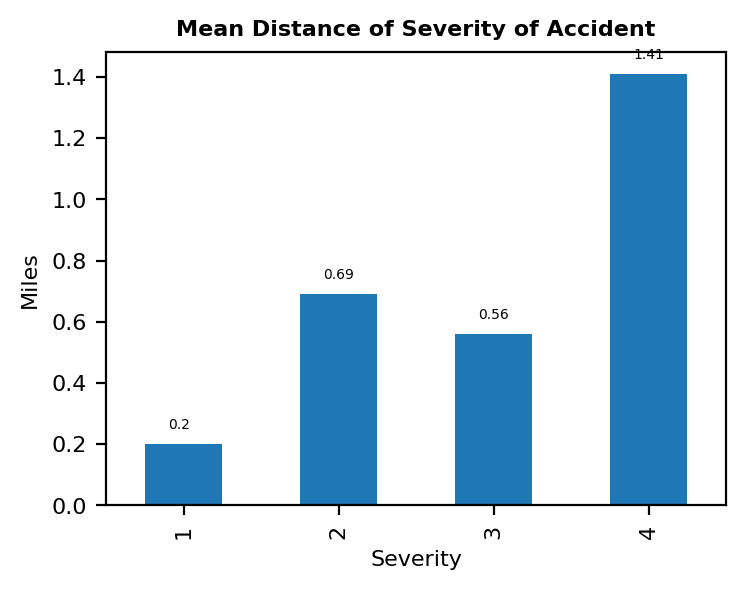

In [ ]:
mean_distance = df.groupby('Severity')["Distance(mi)"].mean().round(2)   # Getting mean distance per severity
ax = mean_distance.plot(kind='bar', stacked=True, figsize=[4, 3])
for index, data in enumerate(mean_distance):
    ax.text(index-0.1, data+0.05, str(data), fontsize = 5)
ax.set_ylabel('Miles',fontsize=8)
ax.set_xlabel('Severity',fontsize=8)
plt.tick_params(labelsize=8)
ax.set_title('Mean Distance of Severity of Accident', fontsize=8, fontweight='bold')

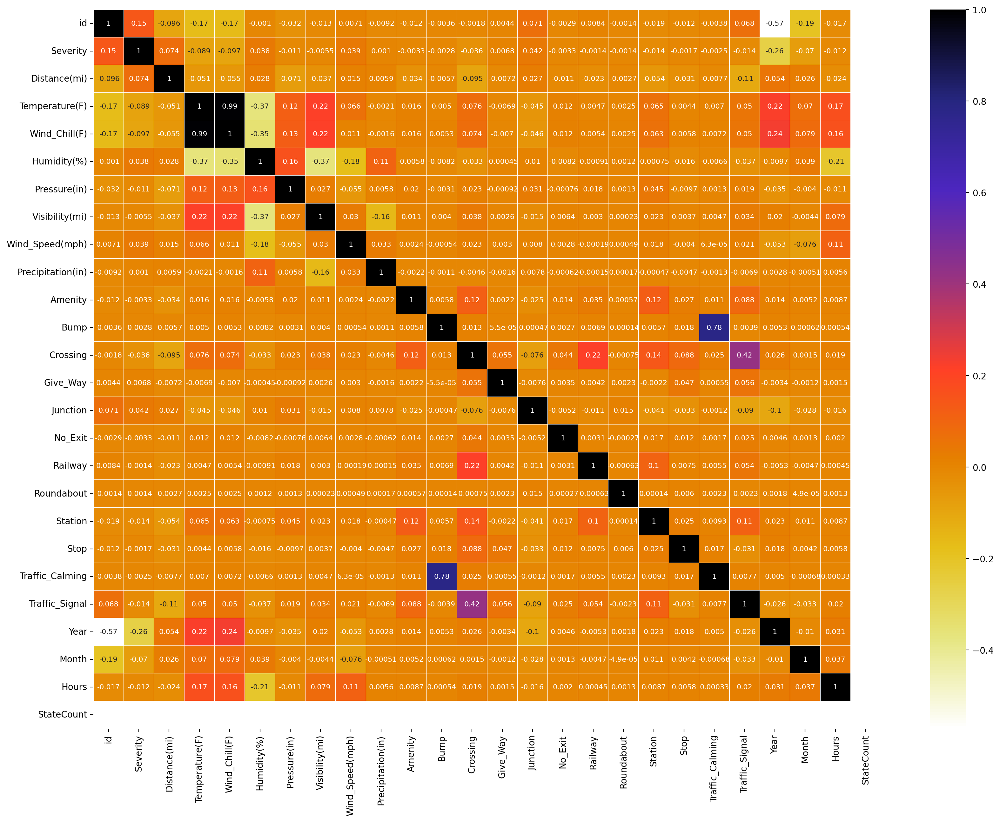

In [ ]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(), annot=True, cmap = plt.cm.CMRmap_r,linewidths=0.1,annot_kws={"size":8})

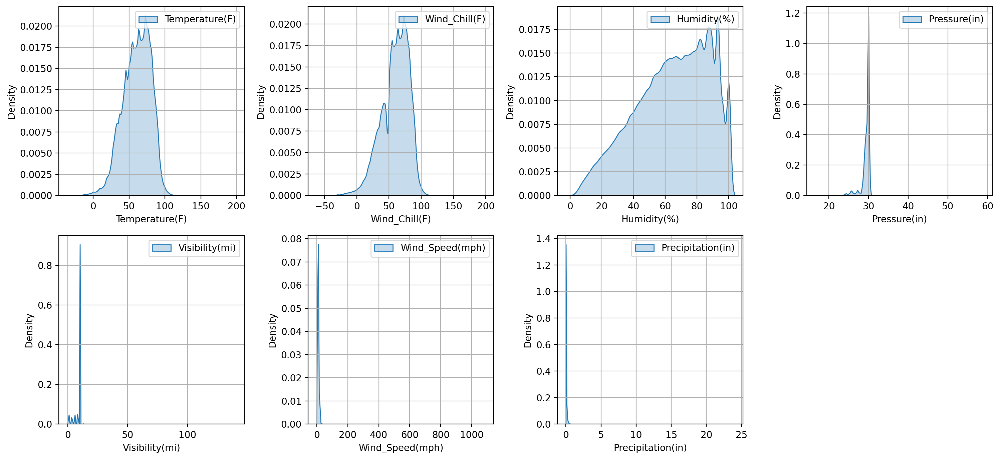

In [ ]:
#Kernel Density Plots for Continuous Features
col = ['Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)','Precipitation(in)']
plt.subplots(figsize=(15, 7))
n = 0
for i in range(2):
    for j in range(4):
        plt.subplot2grid((2,4), (i,j))
        sns.kdeplot(data=df, x=col[n], shade=True)
        plt.grid()
        plt.legend([col[n]],loc='best')
        n += 1
        if n == 7:
            break
plt.tight_layout()
plt.show()

Temperature: Most of the accidents happened at temperature range from 50-80F.

Wind Chill: Most of the accidents happened at wind chill of 50-80F degree celcius.

Humidity: The number of accidents increase with the increase in humidity where humidity level of 80-100 percent had the highest number of cases.

Pressure: Most of the accidents happened at 30 in pressure.

Visibility: Most of the accidents happened at visibility level of 10mi. But we see a peak somewhere at around less than 10mi, which shows that this visibility level has the highest number of cases of accidents.

Wind Speed: The highest number of accidents happened at wind speed of around 10-12 mps.

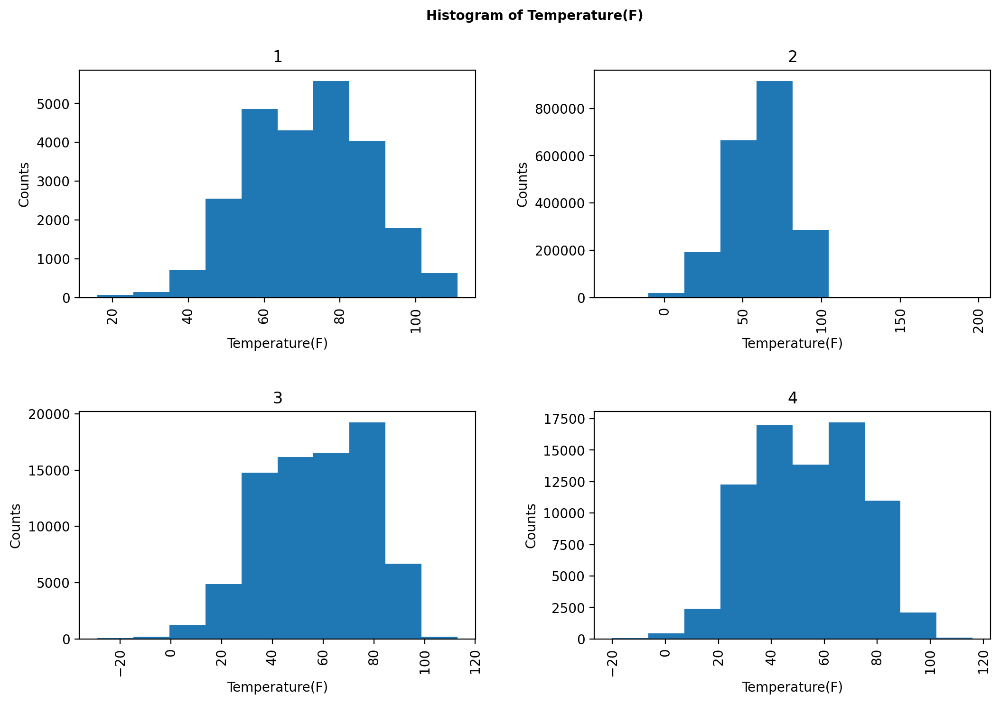

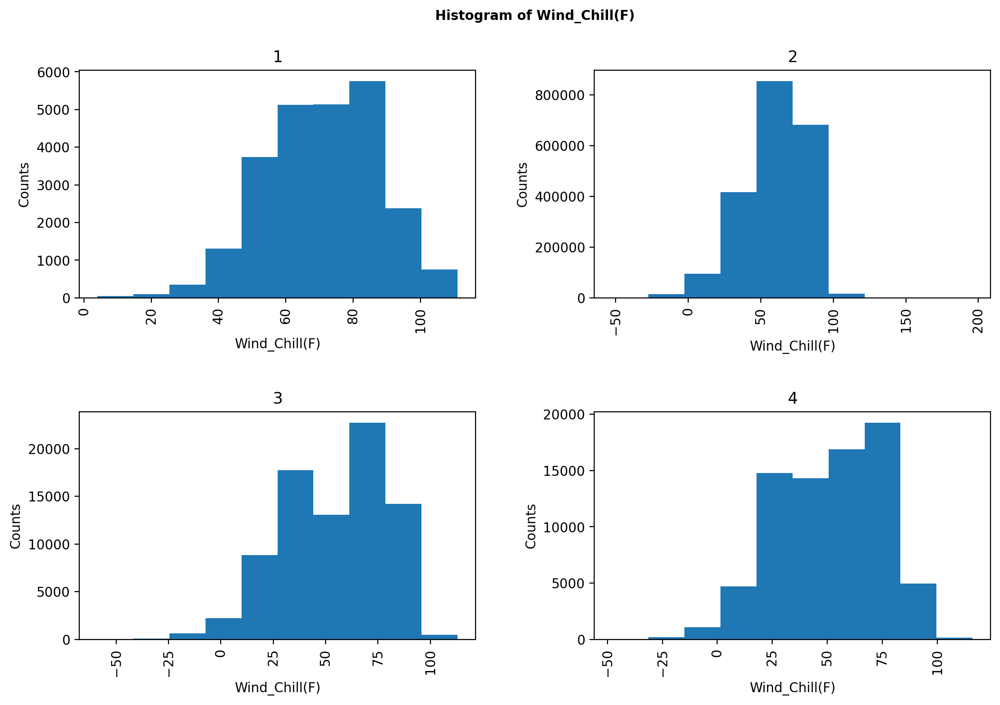

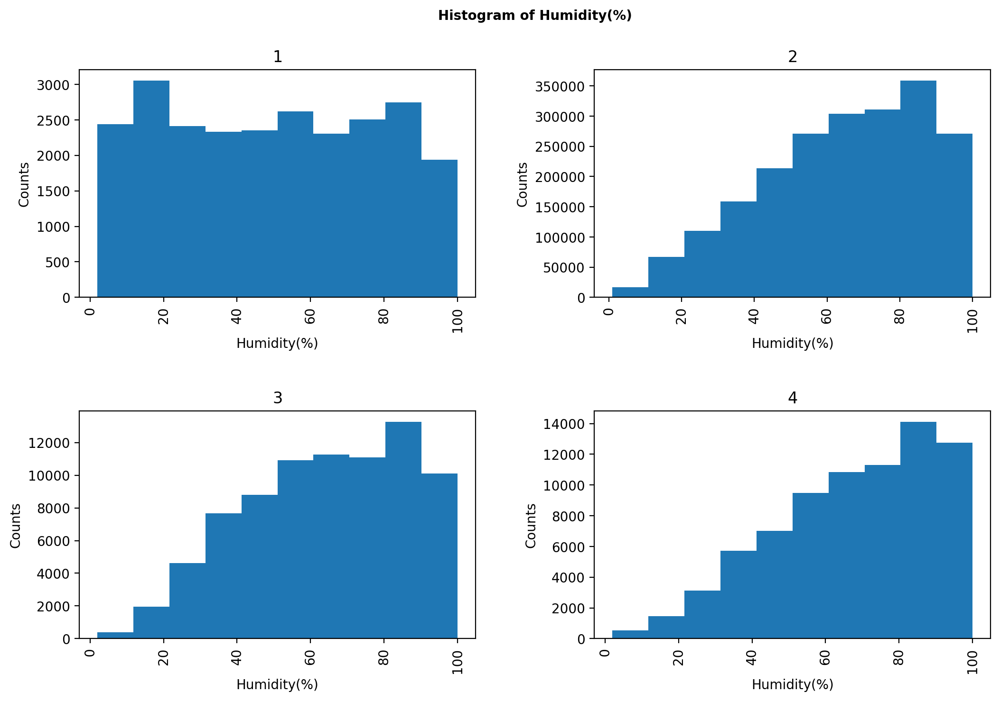

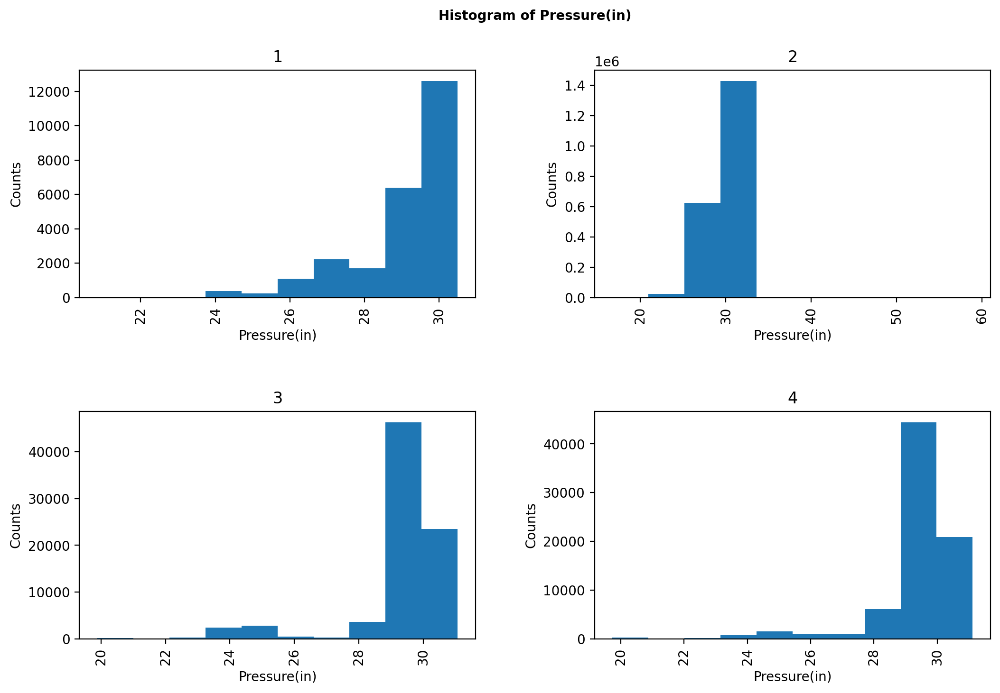

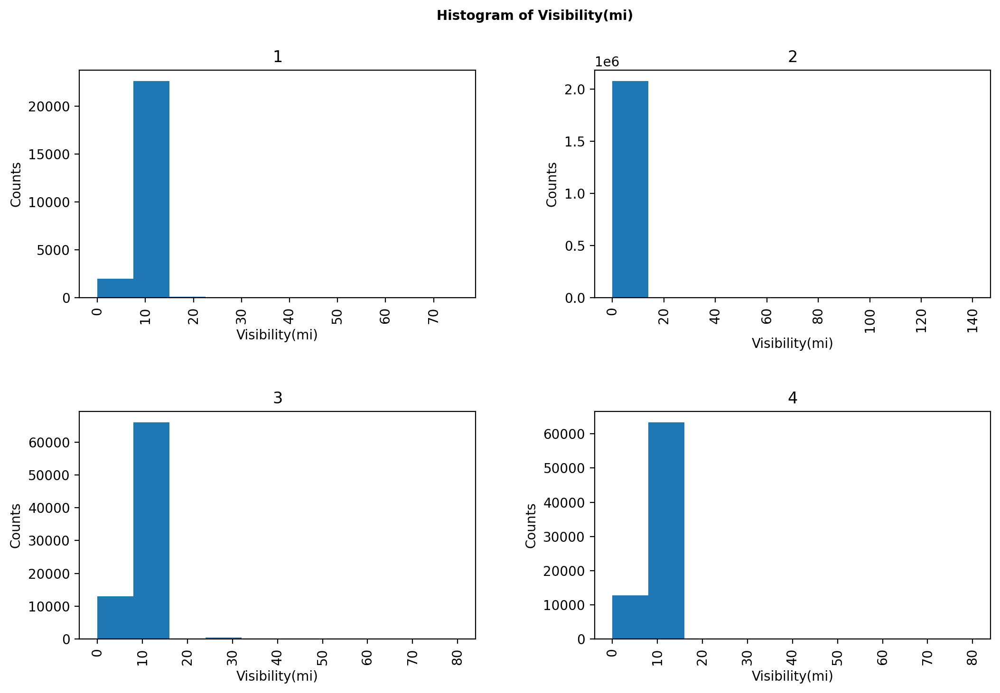

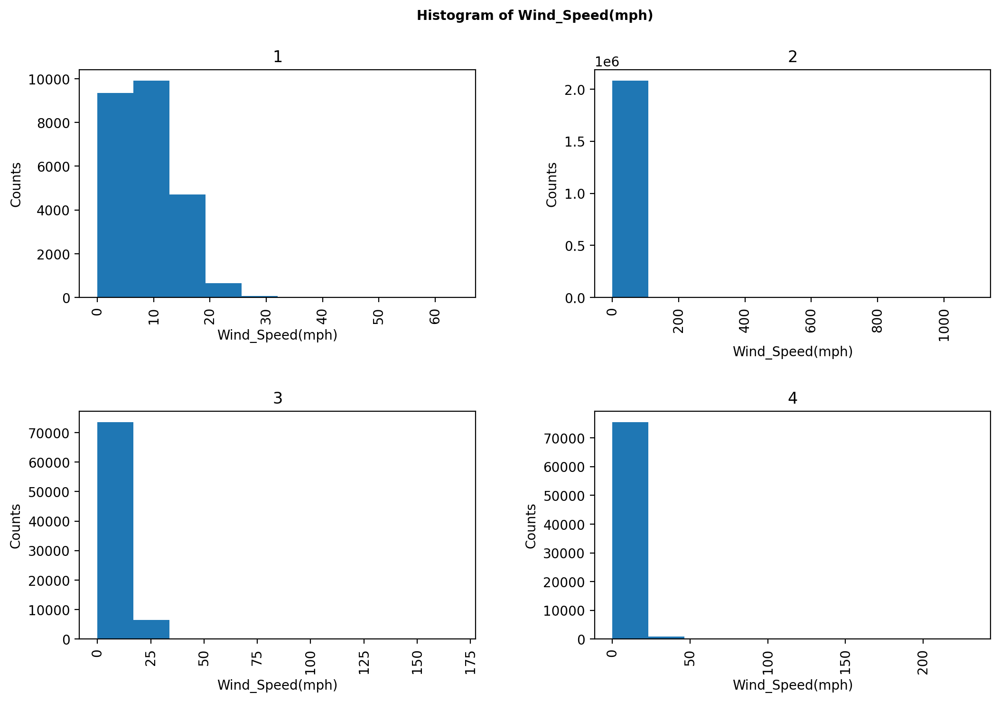

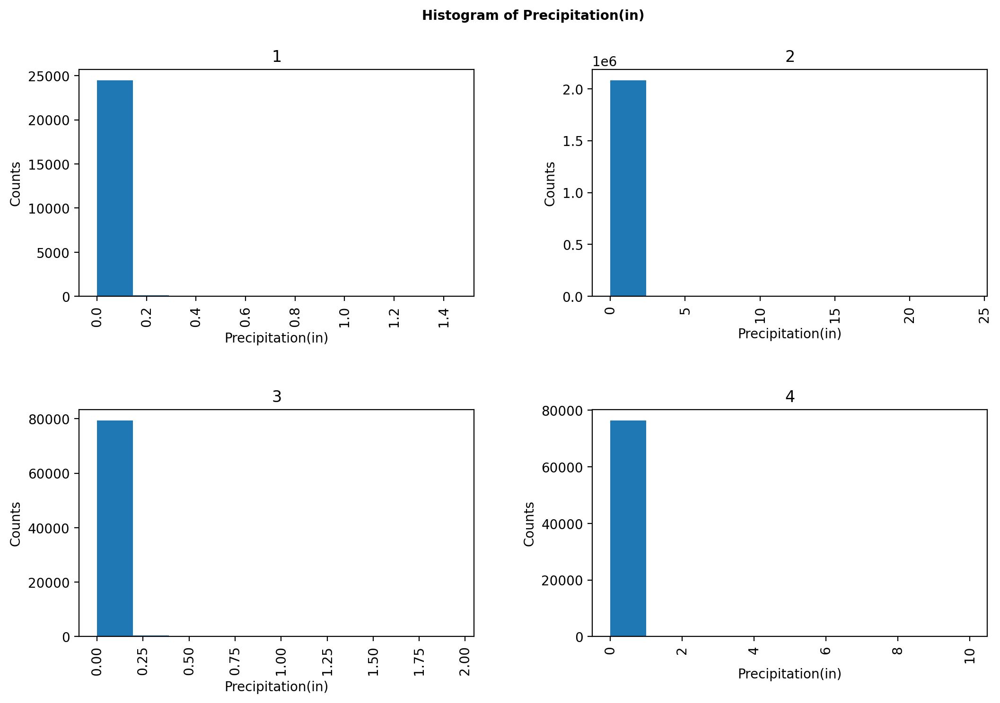

In [ ]:
#Visualizing Histograms of Continuous Features with respect to Severity Level
for i in col:
    ax = df.hist(column=i, by='Severity', grid=True, figsize=(12,8), bins=10)
    for a in ax.flatten():
        a.set_xlabel(i)
        a.set_ylabel("Counts")
    plt.suptitle("Histogram of "+i, fontsize=10, fontweight='bold')

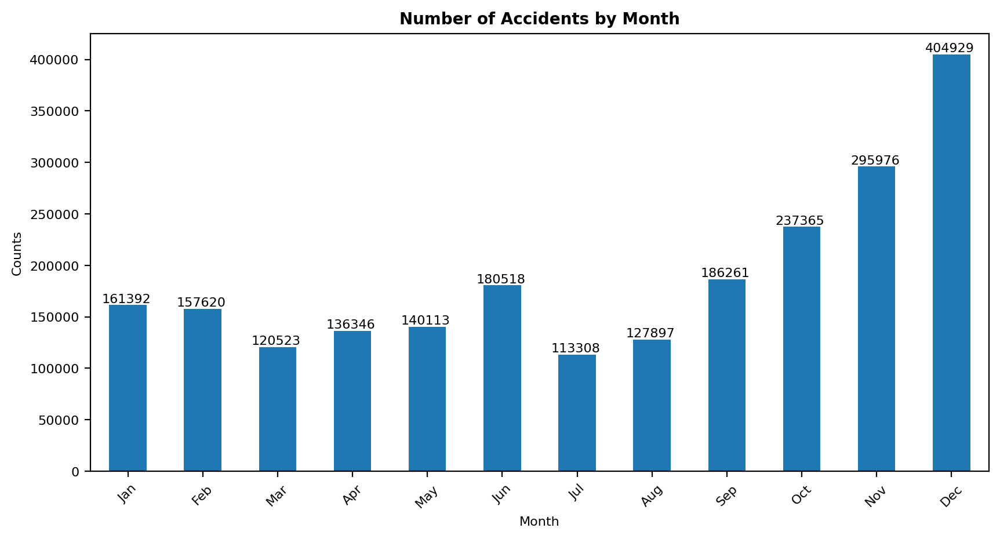

In [ ]:
#Number of Accidents by Month
month_accidents_count = df.groupby('Month').size().reindex([1,2,3,4,5,6,7,8,9,10,11,12])    # Getting the accidents by month and sorting by month
ax = month_accidents_count.plot(kind='bar', stacked=True, figsize=[10, 5])
for index, data in enumerate(month_accidents_count):
    ax.text(index-0.35, data+2500, str(data), fontsize = 8)

plt.xticks(range(0,len(month_accidents_count.index)), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'],rotation=45)    # Converting month number to month name
ax.set_title('Number of Accidents by Month', fontsize=10, fontweight='bold')
ax.set_ylabel('Counts',fontsize=8)
ax.set_xlabel('Month',fontsize=8)
plt.tick_params(labelsize=8)

November and December had the highest number of accidents.

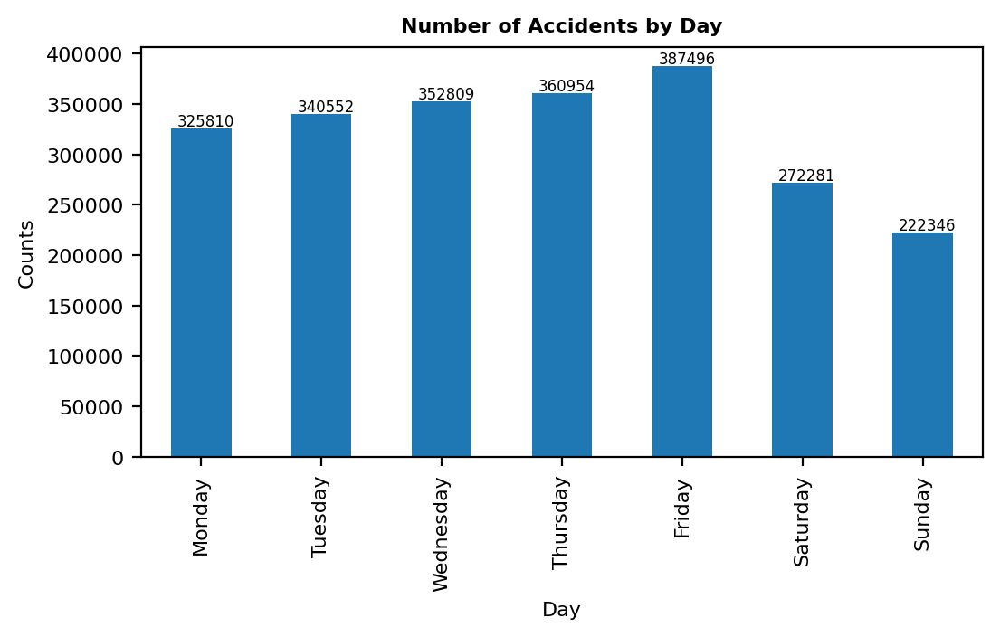

In [ ]:
week_order = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
week_accidents_count = df.groupby('Week').size().reindex(week_order)
ax = week_accidents_count.plot(kind='bar', stacked=True, figsize=[6, 3])
for index, data in enumerate(week_accidents_count):
    ax.text(index-0.2, data+2500, str(data), fontsize = 6)
ax.set_title('Number of Accidents by Day', fontsize=8, fontweight='bold')
ax.set_ylabel('Counts',fontsize=8)
ax.set_xlabel('Day',fontsize=8)
plt.tick_params(labelsize=8)

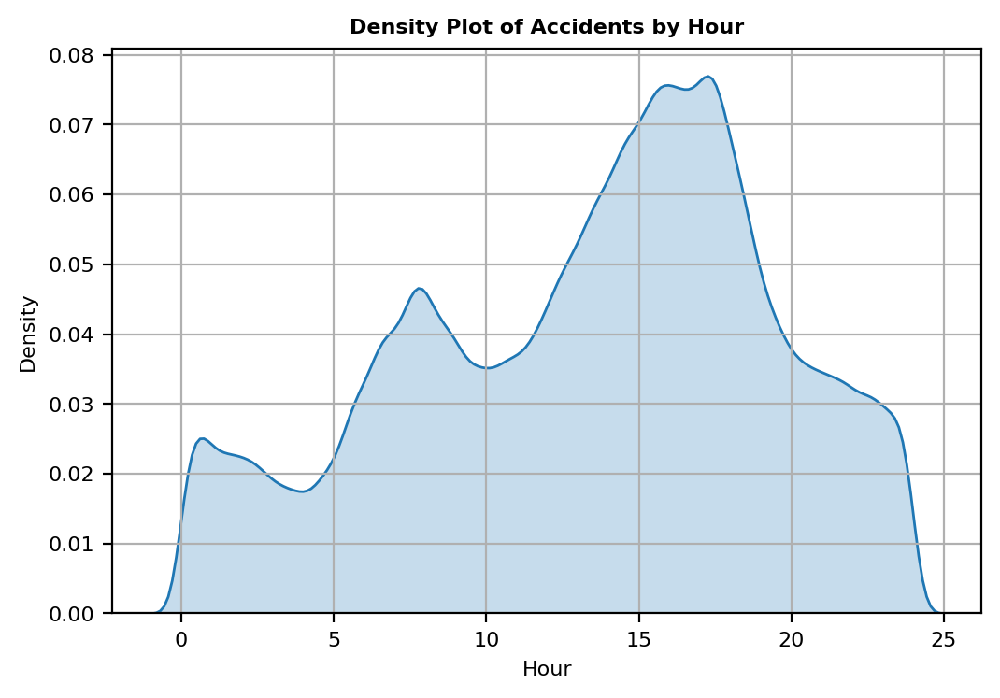

In [ ]:
##**Density Plot of Accidents by Hour
plt.figure(figsize=(6,4))
ax = sns.kdeplot(data=df, x='Hours', shade=True)
plt.grid()
ax.set_title('Density Plot of Accidents by Hour', fontsize=8, fontweight='bold')
ax.set_ylabel('Density',fontsize=8)
ax.set_xlabel('Hour',fontsize=8)
plt.tick_params(labelsize=8)

The highest cases of accidents recorded at 14:00-18:00. These are the peak hours so there is a lot of traffic.

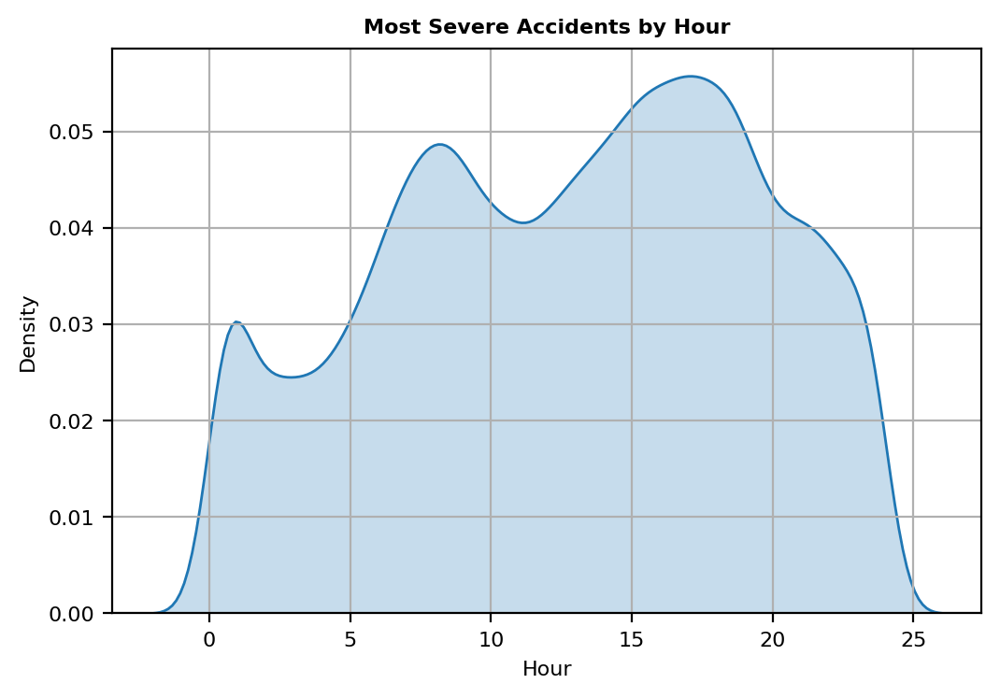

In [ ]:
df_severity = df.query('Severity==4')   # Selecting only the most severe accidents 
##**Density Plot of Accidents by Hour
plt.figure(figsize=(6,4))
ax = sns.kdeplot(data=df_severity, x='Hours', shade=True)
plt.grid()
ax.set_title('Most Severe Accidents by Hour', fontsize=8, fontweight='bold')
ax.set_ylabel('Density',fontsize=8)
ax.set_xlabel('Hour',fontsize=8)
plt.tick_params(labelsize=8)

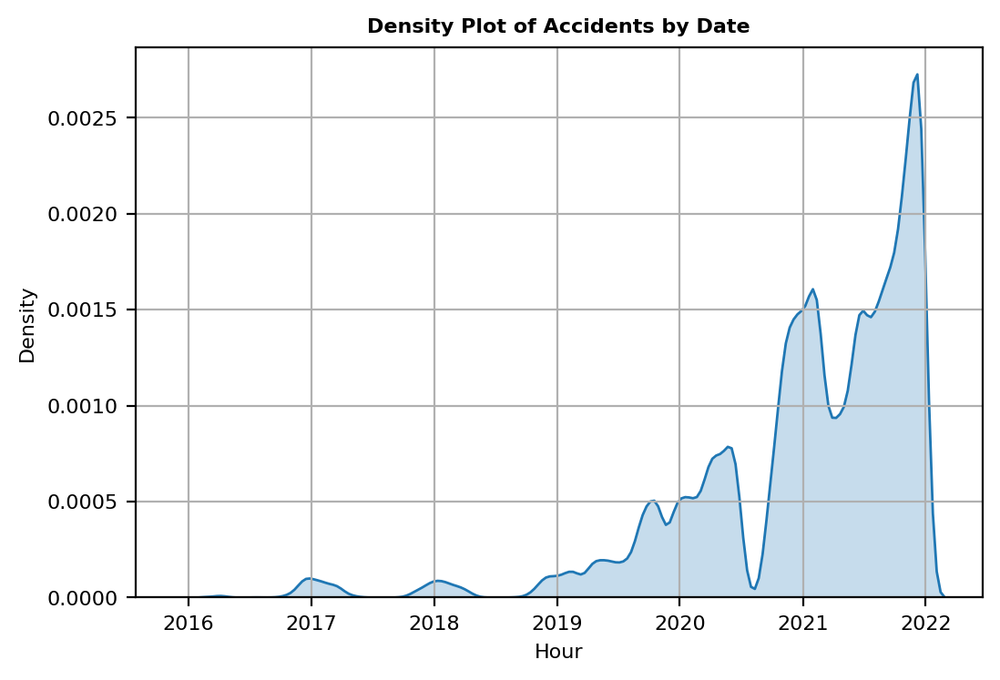

In [ ]:
plt.figure(figsize=(6,4))
ax = sns.kdeplot(pd.to_datetime(df['Date']), shade=True)
plt.grid()
ax.set_title('Density Plot of Accidents by Date', fontsize=8, fontweight='bold')
ax.set_ylabel('Density',fontsize=8)
ax.set_xlabel('Hour',fontsize=8)
plt.tick_params(labelsize=8)

In [ ]:
#Top 10 Weather Condition with most cases of accidents
weather = df.groupby(['Weather_Condition','Severity']).size().unstack()/1000
weather['Sum'] = weather.sum(axis=1)
weather = weather.sort_values(by='Sum',ascending=False).drop(columns=['Sum']).fillna(0).astype(int)
weather

Severity,1,2,3,4
Weather_Condition,,,,
Fair,12,981,22,26
Cloudy,3,305,10,10
Mostly Cloudy,4,262,12,9
Partly Cloudy,2,182,8,6
Light Rain,1,94,4,3
...,...,...,...,...
Sand / Dust Whirls Nearby,0,0,0,0
Heavy Blowing Snow,0,0,0,0
Drifting Snow,0,0,0,0


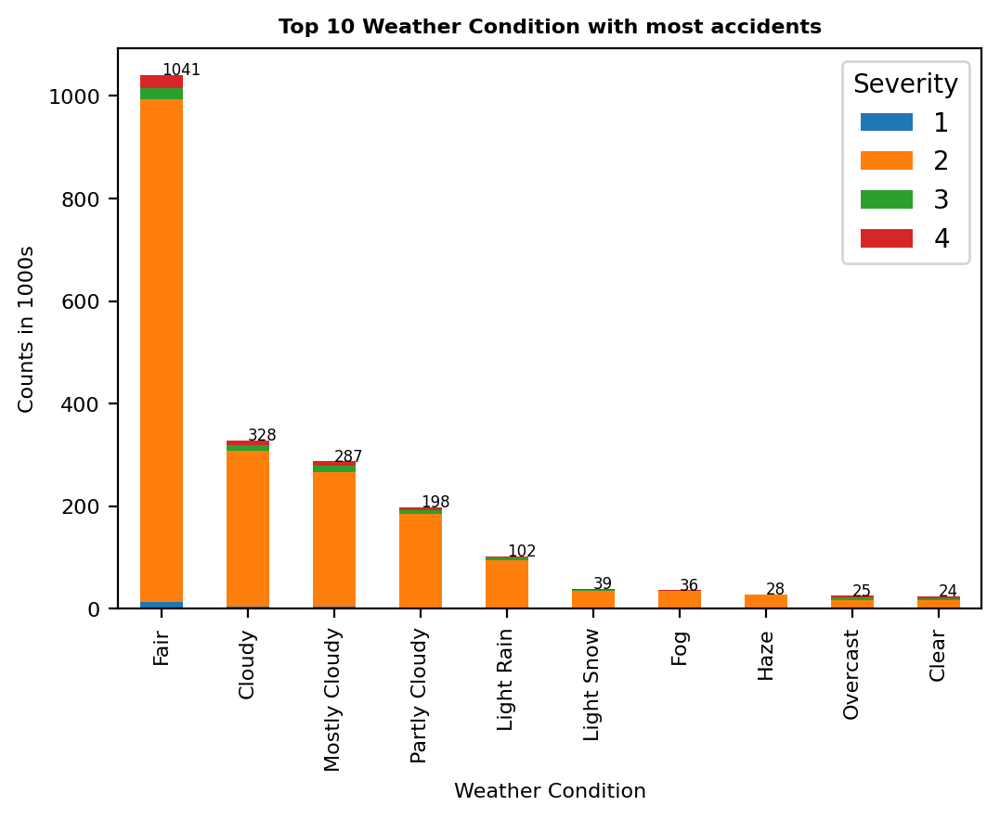

In [ ]:
ax = weather[:10].plot(kind='bar', stacked=True, figsize=[6, 4])
total = weather[:10].sum(axis=1)
for index, data in enumerate(total):
    ax.text(index,data,str(data), fontsize = 6)
ax.set_title('Top 10 Weather Condition with most accidents', fontsize=8, fontweight='bold')
ax.set_ylabel('Counts in 1000s',fontsize=8)
ax.set_xlabel('Weather Condition',fontsize=8)
plt.tick_params(labelsize=8)

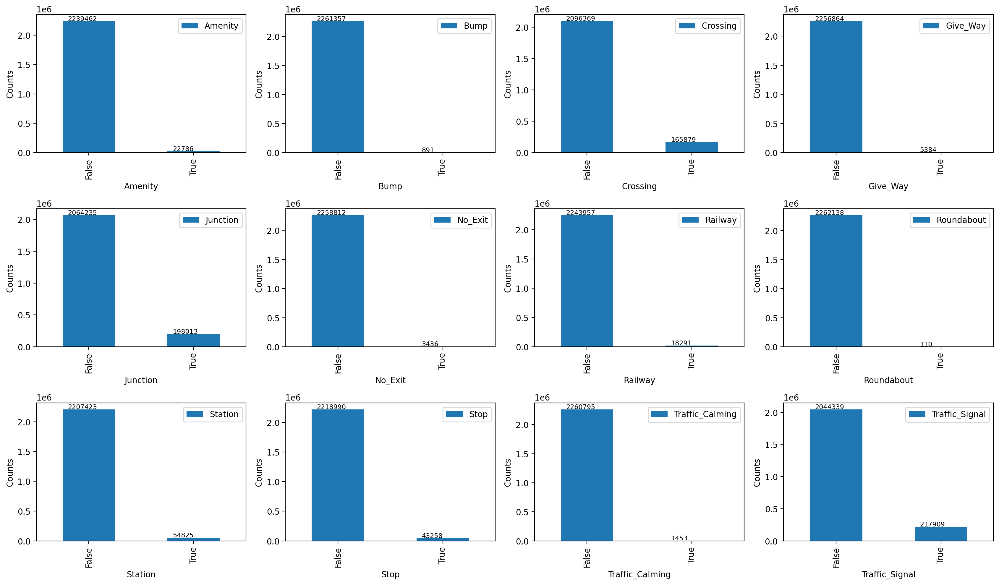

In [ ]:
col = ['Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal']
plt.subplots(figsize=(17, 10))
n = 0
for i in range(3):
    for j in range(4):
        plt.subplot2grid((3,4), (i,j))
        temp = df.groupby(col[n]).size()
        temp.plot(kind='bar', stacked=True)
        for index, data in enumerate(temp):
            plt.text(index-0.2,data+10000,int(data), fontsize = 8)
        plt.ylabel('Counts')
        plt.legend([col[n]],loc='best')
        n += 1
plt.tight_layout()
plt.show()